# Introduction
One of the methods to accelerate a multi-step diffusion model is to use *distill* it into a student model with fewer steps, thereby making it an order of magnitude faster than the teacher model. This notebook implements a varian of this approach called *Consistency Distillation*. We will distill *Stable Diffusion 1.5 (SD1.5)* to generate images from text prompts. The final model will be capable of generating relatively good images in just 4 steps on colab.

## Install necessary dependencies


In [ ]:
# torch 2.4.1+cu124
!pip install diffusers==0.30.3, peft==0.8.2 huggingface_hub==0.23.4 -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 633.8 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.4/183.4 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 402.6/402.6 kB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Some Theory to Get Started

---
### Diffusion Models

We define a forward diffusion process that transforms clean images into noise using the distribution $q(\mathbf{x}_t | \mathbf{x}_0)= {N}(\mathbf{x}_t | \alpha_t \mathbf{x}_0, \sigma^2_t I)$

hus, noisy images can be obtained using the following formula: $\mathbf{x}_t = \alpha_t \mathbf{x}_0 + \sigma_t \epsilon$, где $\epsilon{\sim} {N}(0, I)$ **(1)**

The parameters $\alpha_t$ and $\sigma_t$ govern the noise process. We сconsider the *variance preserving (VP)* process: $\alpha^2_t = 1 - \sigma^2_t$.

A diffusion model (DM) attempts to solve the reverse problem: generating new images from noise.

It is important to note that the diffusion process can be described by an ordinary differential equation (ODE):

 $dx = \left[ f(\mathbf{x}, t) - \frac{1}{2} \nabla_{\mathbf{x}_t} \log p_t(\mathbf{x}) \right] dt$, **(2)**

where $f(\mathbf{x}, t)$ is known from the defined noising process, and the *score function* $\nabla_{\mathbf{x}_t} \log p_t(\mathbf{x}_t)$ is estimated using a neural network: $s_\theta(\mathbf{x}_t, t) \approx \nabla_{\mathbf{x}_t} \log p_t(\mathbf{x}_t)$. Thus, with an estimate for $\nabla_{\mathbf{x}_t} \log p_t(\mathbf{x})$, we can solve this ODE starting from random noise to obtain an image.

**SD1.5** employs the *$\epsilon$-parameterization*, i.e., the UNet is trained to predict the noise added to the image according to Equation **(1)**. The score function can be estimated using Tweedie’s formula: $s_\theta(\mathbf{x}_t, t) = - \frac{\epsilon_\theta(\mathbf{x}_t, t)} { \sigma_t}$

To solve the ODE **(2)**, we require a numerical method (solver). In this work, we use the popular but not necessarily the most efficient solver: **DDIM**—an adaptation of the Euler method for the diffusion ODE.

For a VP process, a DDIM transition from time $t$ to $s$ is given by:

$
x_s = DDIM(\mathbf{x}_t, t, s) = \alpha_s \cdot \left(\frac{\mathbf{x}_t - \sigma_t \epsilon_\theta}{\alpha_t} \right) + \sigma_s \epsilon_\theta
$

This transition can be interpreted as follows: we first estimate the clean image $\mathbf{x}_0$ at step $t$ using $\frac{\mathbf{x}_t - \sigma_t \epsilon_\theta}{\alpha_t}$ а and then add noise corresponding to the new step $s$ using Eq. **(1)**, but using the noise predicted by the model$\epsilon_\theta$ rather than random noise.

*Using DDIM for SD1.5 allows us to generate high-quality images in 50 steps.*

**SD1.5** - s a latent DM, meaning that the model operates in a latent space (obtained via a VAE) rather than directly in pixel space. Therefore, SD1.5 consists of the following components:

1) **VAE** - Converts $3{\times}512{\times}512$ кimage into latents of size $4{\times}64{\times}64$ and can decode these latents back into images.
2) **Text Encoder** - Extracts text features from the prompt. These features guide the diffusion model, indicating what should be generated.
3) **Diffusion Model** - A UNet that operates on the “latent images” of size $4{\times}64{\times}64$.

---
### [Consistency Models](https://arxiv.org/pdf/2303.01469)

The main goal of diffusion distillation is to reduce the number of diffusion model steps while maintaining high image quality.

**Consistency Models (CM)** - are a class of models where we aim to learn a “consistency function” $f_\theta(\mathbf{x}_t)$ that predicts the clean data $\mathbf{x}_{t}$ directly from any point $\mathbf{x}_{0}$ along the diffusion ODE trajectory (2) in one step. If this consistency function is learned perfectly, we could directly step from pure noise to an image, making the generation process highly efficient compared to traditional diffusion models. Note that a consistency model can be trained as an independent generative model without a pre-trained diffusion model.

<br>

<div>

<img src="https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/cd-idea.jpg" width="600"/>
</div>


**Consistency Distillation (CD)** is an approach where a pre-trained diffusion model is used to initialize and guide the training of the consistency model. The pre-trained diffusion model provides a good initialization and an already trained score function, which greatly facilitates the convergence of the consistency model.


#### Training the Consistency Model

<div>
<img src="https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/cd-training.jpg" width="600"/>
</div>


The main principle in training consistency models is to enforce a *self-consistency* property: the outputs of the consistency model at two adjacent points on the trajectory $\mathbf{x}_{t}$ and $\mathbf{x}_{t-1}$ should be similar. This is often measured using an L2 distance: $\lVert f_\theta(\mathbf{x}_{t-1}) - f_\theta(\mathbf{x}_{t}) \rVert^2_2$.

It is important to note that this self-consistency property could be trivially satisfied (e.g., by setting $f_\theta(\mathbf{x}_{t}) \equiv 0$). To avoid such degenerate solutions, a *boundary condition* is imposed, requiring that the model predicts the input image at the beginning of the trajectory:

$f_\theta(\mathbf{x}_0) = \mathbf{x}_0$.

**Practical Remark:** The same model  $f_\theta(\cdot)$ is used for both points along the trajectory. However, the output of the model at step ${t-1}$ яserves as a target for the output at step $t$, so the model evaluation for step $t-1$ is performed in a *torch.no_grad* mode.

**How to Obtain Two Neighboring Points on the ODE Trajectory?**

- Choose a random image $\mathbf{x}_0$ from the dataset.

- Generate $\mathbf{x}_t$ пusing the forward noising process: $\mathbf{x}_t = q(\mathbf{x}_t | \mathbf{x}_0)$

- To obtain the neighboring point $\mathbf{x}_{t-1}$, perform a step along the ODE trajectory using, for example, a DDIM solver $\mathbf{x}_{t-1} = DDIM(\epsilon_\theta(\mathbf{x}_t, t), \mathbf{x}_t, t, t-1)$.

**Important:** in practice, the steps might not be strictly consecutive (i.e. $t$ and $t-1$). Instead, a larger interval (e.g., 20 steps) may be used. The interval size influences the bias/variance trade-off in consistency training: a larger interval leads to higher bias but lower variance, and vice versa. For simplicity in this task, the interval is fixed at 20 steps, though many studies allow the interval to change dynamically during training.

## Import the Libraries


In [ ]:
import os, csv, gc, functools, time
from tqdm import tqdm

import torch
from torchvision import transforms
import numpy as np
from PIL import Image
from diffusers import StableDiffusionPipeline, LCMScheduler, UNet2DConditionModel, DDIMScheduler

from peft import PeftModel, LoraConfig, get_peft_model, get_peft_model_state_dict

from google.colab import userdata

%matplotlib inline
import matplotlib.pyplot as plt
from IPython import display

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
#---------------------
# Visualization utils
#---------------------

def visualize_images(images):
    assert len(images) == 4
    plt.figure(figsize=(12, 3))
    for i, image in enumerate(images):
        plt.subplot(1, 4, i+1)
        plt.imshow(image)
        plt.axis('off')

    plt.subplots_adjust(wspace=-0.01, hspace=-0.01)


#--------------
# Tensor utils
#--------------

def extract_into_tensor(a, t, x_shape):
    b, *_ = t.shape
    out = a.gather(-1, t)
    return out.reshape(b, *((1,) * (len(x_shape) - 1)))

#--------------
# Memory utils
#--------------

def clear_memory():
  # Delete variables if they exist in the current global scope
    if "inputs" in globals():
        del globals()["inputs"]
    if "model" in globals():
        del globals()["model"]
    if "processor" in globals():
        del globals()["processor"]
    if "trainer" in globals():
        del globals()["trainer"]
    if "peft_model" in globals():
        del globals()["peft_model"]
    if "bnb_config" in globals():
        del globals()["bnb_config"]
    time.sleep(2)

    # Garbage collection and clearing CUDA memory
    gc.collect()
    time.sleep(2)
    torch.cuda.empty_cache()
    torch.cuda.synchronize()
    time.sleep(2)
    gc.collect()
    time.sleep(2)

    print(f"GPU allocated memory: {torch.cuda.memory_allocated() / 1024**3:.2f} GB")
    print(f"GPU reserved memory: {torch.cuda.memory_reserved() / 1024**3:.2f} GB")

#---------------
# Dataset utils
#---------------

class COCODataset(torch.utils.data.Dataset):
    def __init__(self, root_dir, subset_name="train2014_5k", transform=None, max_cnt=None):
        """
        Arguments:
            root_dir (string): Директория с картинками
            transform (callable, optional): преобразования, применимые к картинкам
        """
        self.root_dir = root_dir
        self.transform = transform
        self.extensions = (
            ".jpg",
            ".jpeg",
            ".png",
            ".ppm",
            ".bmp",
            ".pgm",
            ".tif",
            ".tiff",
            ".webp",
        )
        sample_dir = os.path.join(root_dir, subset_name)

        # Collect image paths
        self.samples = sorted(
            [
                os.path.join(sample_dir, fname)
                for fname in os.listdir(sample_dir)
                if fname[-4:] in self.extensions
            ],
            key=lambda x: x.split("/")[-1].split(".")[0],
        )
        self.samples = (
            self.samples if max_cnt is None else self.samples[:max_cnt]
        )  #

        # Collect prompts
        self.captions = {}
        with open(
            os.path.join(root_dir, f"{subset_name}.csv"), newline="\n"
        ) as csvfile:
            spamreader = csv.reader(csvfile, delimiter=",")
            for i, row in enumerate(spamreader):
                if i == 0:
                    continue
                self.captions[row[1]] = row[2]

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample_path = self.samples[idx]
        sample = Image.open(sample_path).convert("RGB")

        if self.transform:
            sample = self.transform(sample)

        return {
            "image": sample,
            "text": self.captions[os.path.basename(sample_path)],
            "idxs": idx, }

# Teacher Model (SD1.5)

## Part 1

Load [StableDiffusion 1.5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5) and generate images in 50 steps.

**Important:** to save some space convert everything to FP16 and load the model with GPU.

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("sd-legacy/stable-diffusion-v1-5",
                                                torch_dtype=torch.float16).to('cuda')

# Assert everything is in FP16 and with cuda
assert pipe.unet.dtype == torch.float16 and pipe.unet.device.type == 'cuda'
assert pipe.vae.dtype == torch.float16 and pipe.vae.device.type == 'cuda'
assert pipe.text_encoder.dtype == torch.float16 and pipe.text_encoder.device.type == 'cuda'

# Use DDIM
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")
pipe.scheduler.timesteps = pipe.scheduler.timesteps.cuda()
pipe.scheduler.alphas_cumprod = pipe.scheduler.alphas_cumprod.cuda()

# Teacher model that we will distill later
teacher_unet = pipe.unet
assert teacher_unet.device.type == 'cuda'

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_token.py:81: UserWarning: 
Access to the secret `HF_TOKEN` has not been granted on this notebook.
You will not be requested again.
Please restart the session if you want to be prompted again.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker%2Fconfig.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### SD 50 Steps

  0%|          | 0/50 [00:00<?, ?it/s]

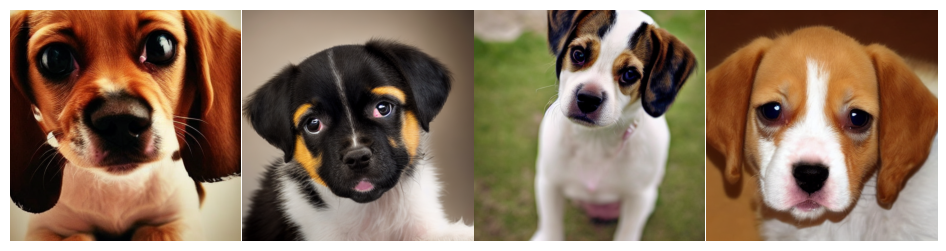

In [ ]:
prompt = "A sad puppy with large eyes"
guidance_scale = 7.5
generator = torch.Generator('cuda').manual_seed(1)

images = pipe([prompt],
             generator=generator,
             num_inference_steps=50,
             num_images_per_prompt=4,
             guidance_scale=guidance_scale).images

visualize_images(images)

### SD 4 Steps

  0%|          | 0/4 [00:00<?, ?it/s]

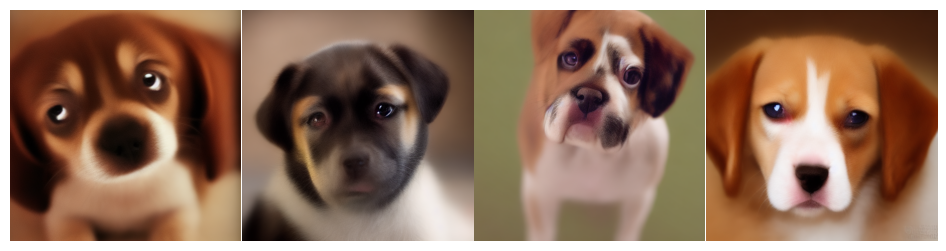

In [ ]:
generator = torch.Generator('cuda').manual_seed(1)

images = pipe([prompt],
             generator=generator,
             num_inference_steps=4,
             num_images_per_prompt=4,
             guidance_scale=guidance_scale).images

visualize_images(images)

In 4 steps the images are very blurry. We will try to fix that.

##  Dataset

We will use a subset of 5000 samples (text-image pairs) from COCO dataset.

n interesting property of consistency models is that they can converge to a reasonable quality in just a few hundred steps. The quality will still not be perfect, but the phase transition should already be noticeable.

After running the cell below, you will have:
* Folder train2014_5k with 5000 images
* File train2014_5k.csv with 5000 prompts


In [ ]:
!wget https://storage.yandexcloud.net/yandex-research/train2014_5k.tar.gz
!tar -xzf train2014_5k.tar.gz

--2025-03-04 09:02:00--  https://storage.yandexcloud.net/yandex-research/train2014_5k.tar.gz
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 818380970 (780M) [application/x-tar]
Saving to: ‘train2014_5k.tar.gz’

train2014_5k.tar.gz 100%[===================>] 780.47M  14.4MB/s    in 57s     

2025-03-04 09:02:58 (13.8 MB/s) - ‘train2014_5k.tar.gz’ saved [818380970/818380970]



## Preprocess the Data and Create Loader

In [ ]:
transform = transforms.Compose(
    [
        transforms.Resize(512),
        transforms.CenterCrop(512),
        transforms.ToTensor(),
        lambda x: 2 * x - 1,
    ]
)
dataset = COCODataset(".",
    subset_name="train2014_5k",
    transform=transform,
    #max_cnt=1000 # Uncomment for debugging
)
#assert len(dataset) == 1000 # Uncomment for debugging

batch_size = 8 # Recommended for Colab

train_dataloader = torch.utils.data.DataLoader(
    dataset=dataset, shuffle=True, batch_size=batch_size, drop_last=True
)

In [ ]:
@torch.no_grad()
def prepare_batch(batch, pipe):
    """
    Preprocessing of a batch of data.
    Map image to latents, and map text to embeddings.
    Params:

    Return:
        latents: torch.Tensor([B, 4, 64, 64], dtype=torch.float16)
        prompt_embeds: torch.Tensor([B, 77, D], dtype=torch.float16)
    """

    # Tokenize prompts
    text_inputs = pipe.tokenizer(
        batch['text'],
        padding="max_length",
        max_length=pipe.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    )

    # Extract text embeddings from text encoder
    prompt_embeds = pipe.text_encoder(text_inputs.input_ids.cuda())[0]

    # Convert image to latents using VAE
    image = batch['image'].to("cuda", dtype=torch.float16)
    latents = pipe.vae.encode(image).latent_dist.sample()
    latents = latents * pipe.vae.config.scaling_factor
    return latents, prompt_embeds

### Preparing model and optimizer

Load UNet and initialize the weights from SD1.5.
This model will be stored in full precision (FP32) for stability and quality reasons.

In [ ]:
unet = UNet2DConditionModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet").to('cuda')
unet.train()
assert unet.dtype == torch.float32
assert unet.training
assert unet.device.type == 'cuda'

unet%2Fconfig.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

We are going to train the model using Parameter Efficient Fine-Tuning (PEFT) techniques, in particular, Low Rank Approximation (LoRA) adapters.

Basically, LoRA provides a small update per weight matrix $W \in \mathbb{R}^{m{\times}n} $ by training two low-rank matrices $W_A \in \mathbb{R}^{k{\times}n}$ and $W_B \in \mathbb{R}^{k{\times}m}$, where $k$ - is the rank, significantly smaller than $m$ and $n$.

Thus, the new updated matrix can be represented as $\hat{W} = W + \Delta W = W + W^T_B W_A$.  
During inference $\Delta W$ can be merged into $W$ to get the final model. This as also a huge advantage of LoRA: store one model and many adapters instead of many models. Without merging the adapters, the dense layer computations can be treated as follows:
<img src=https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/lora-idea.jpg width=300>

In [ ]:
# A list of modultes to which LoRa will be applied.
lora_modules = [
    "to_q", "to_k", "to_v", "to_out.0", "proj_in", "proj_out",
    "ff.net.0.proj", "ff.net.2", "conv1", "conv2", "conv_shortcut",
    "downsamplers.0.conv", "upsamplers.0.conv", "time_emb_proj"
]
lora_config = LoraConfig(
    r=64, # rank of A and B.
    target_modules=lora_modules
)

# Create the wrapper of the original UNet with LoRa adapters with PEFT library
cm_unet = get_peft_model(unet, lora_config, adapter_name="ct")

# Enable gradient checkpointing to save GPU memory
cm_unet.enable_gradient_checkpointing()

# Optimizer
optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=1e-4)

# Loss of CM objective (L2 norm, averaged along all dimentions)
mse_loss = torch.nn.functional.mse_loss

## Part 2

####  DDIM Step

DDIM step from $\mathbf{x}_t$ to $\mathbf{x}_s$ can be done the following way:

$
\mathbf{x}_s = DDIM(\epsilon_\theta, \mathbf{x}_t, t, s) = \alpha_s \cdot \left(\frac{\mathbf{x}_t - \sigma_t \epsilon_\theta}{\alpha_t} \right) + \sigma_s \epsilon_\theta
$

**Keep in mind that *scheduler.alphas_cumprod*** sets $\bar\alpha_{t} = \prod^t_{i=1} (1-\beta_i)$ in classic DDPM formulation: [Denoising Diffusion Probabilistic Models](https://arxiv.org/pdf/2006.11239).

In [ ]:
def ddim_solver_step(model_output, x_t, t, s, scheduler):
    """
    DDIM solver step for VP and eps-prediction model
    params:
        model_output: torch.Tensor[B, 4, 64, 64] -  model prediction (noise eps)
        x_t: torch.Tensor[B, 4, 64, 64] - samples at step t
        t: torch.Tensor[B] - current step index
        s: torch.Tensor[B] - next step index
        scheduler: DDIMScheduler - noise scheduler to get alpha and sigma
    """
    alphas_cumprod = scheduler.alphas_cumprod
    alphas = alphas_cumprod ** 0.5
    sigmas = (1 - alphas_cumprod) ** 0.5

    sigmas_s = extract_into_tensor(sigmas, s, x_t.shape)
    alphas_s = extract_into_tensor(alphas, s, x_t.shape)

    sigmas_t = extract_into_tensor(sigmas, t, x_t.shape)
    alphas_t = extract_into_tensor(alphas, t, x_t.shape)

    # Boundary values for alpha and sigma
    alphas_s[s == 0] = 1.0
    sigmas_s[s == 0] = 0.0

    alphas_t[t == 0] = 1.0
    sigmas_t[t == 0] = 0.0

    # x0 estimate at step t
    x_0 = (x_t -  sigmas_t * model_output) / (alphas_t + 1E-9)
    # Step towards s
    x_s = alphas_s * x_0 + sigmas_s * model_output
    return x_s

####  Noising process

$q(\mathbf{x}_t | \mathbf{x}_0)= {N}(\mathbf{x}_t | \alpha_t \mathbf{x}_0, \sigma^2_t I)$

$\mathbf{x}_t = \alpha_t \mathbf{x}_0 + \sigma_t \epsilon$, где $\epsilon{\sim} {N}(0, I)$

In [ ]:
def q_sample(x, t, scheduler, noise=None):
    alphas_cumprod = scheduler.alphas_cumprod
    alphas = alphas_cumprod ** 0.5
    sigmas = (1 - alphas_cumprod) ** 0.5

    if noise is None:
        noise = torch.randn_like(x)

    sigmas_t = extract_into_tensor(sigmas, t, x.shape)
    alphas_t = extract_into_tensor(alphas, t, x.shape)

    x_t = alphas_t * x + sigmas_t * noise
    return x_t

Training consistency models without a teacher is called **Consistency Training (CT)**.  
In this case, a Consistency Model (CM) can be viewed as a standalone type of generative model. We will use this approach and train our first consistency model based on SD1.5.

## Part 3

In consistency distillation, the teacher model is used to obtain the second point on the ODE trajectory. We can we try to estimate the neighboring point analytically using the DDIM step formula provided above and recalling how we estimate the score function in denoising score matching.

$\epsilon_\theta(x_t, t) = - \sigma_t s_\theta(x_t, t)$

$s_\theta(x_t, t) \approx \nabla_{x_t} \log q(x_t) = \mathop{\mathbb{E}}_{\mathbf{x}\sim p_{data}}\left [ \nabla_{\mathbf{x}_t} \log q(\mathbf{x}_t | \mathbf{x}) \vert \mathbf{x}_t \right ] \approx \nabla_{\mathbf{x}_t} \log q(\mathbf{x}_t \vert \mathbf{x})$

---

    
$x_s = \frac{\sqrt{\bar{\alpha}_s}}{\sqrt{\bar{\alpha}_t}} \left( x_t - \sqrt{1-\bar{\alpha}_t}\,\epsilon_\theta(x_t,t) \right) + \sqrt{1-\bar{\alpha}_s}\,\epsilon_\theta(x_t,t)
$

OR

$
s_\theta(x_t, t)= \frac{x_t - \alpha_t\,x_0}{\sigma_t^2}
$

$
x_s = \frac{\alpha_s}{\alpha_t}\,x_t
       + (\sigma_s\,\sigma_t - \frac{\alpha_s\,\sigma_t^2}{\alpha_t})
         s_\theta(x_t, t).
$
---
[Original paper](https://arxiv.org/pdf/2303.01469).


In [ ]:
def get_xs_from_xt_naive(
    x_0, x_t, t, s,  # not all arguments will be used
    scheduler,
    noise=None,
    **kwargs
):
    """
    params:
        x_0: torch.Tensor[B, 4, 64, 64] - samples at step 0
        x_t: torch.Tensor[B, 4, 64, 64] - samples at step t
        t: torch.Tensor[B] - current step index
        s: torch.Tensor[B] - next step index
        scheduler: DDIMScheduler - noise scheduler to get alpha and sigma

    returns:
        x_s: torch.Tensor[B, 4, 64, 64] - Point x_s in CT mode (analytical).
    """

    if x_t is None:
        #x_t = q_sample(x_0, t, scheduler, noise=noise) # Another solution
        return q_sample(x_0, s, scheduler, noise=noise)


    alphas_cumprod = scheduler.alphas_cumprod
    alphas = alphas_cumprod ** 0.5
    sigmas = (1 - alphas_cumprod) ** 0.5

    sigmas_s = extract_into_tensor(sigmas, s, x_0.shape)
    alphas_s = extract_into_tensor(alphas, s, x_0.shape)

    sigmas_t = extract_into_tensor(sigmas, t, x_t.shape)
    alphas_t = extract_into_tensor(alphas, t, x_t.shape)

    # Boundary values for alpha and sigma
    alphas_s[s == 0] = 1.0
    sigmas_s[s == 0] = 0.0

    alphas_t[t == 0] = 1.0
    sigmas_t[t == 0] = 0.0

    score_function = (x_t - alphas_t * x_0) / (sigmas_t ** 2)
    x_s = (alphas_s / alphas_t) * x_t + \
     (sigmas_s * sigmas_t - alphas_s * sigmas_t ** 2 / alphas_t) * score_function

    return x_s

### Loss for CM

In [ ]:
def cm_loss_template(
    latents, prompt_embeds, # batch of latents and text embeddings
    unet, scheduler,

    # Functions which will be defined later
    loss_fn: callable,
    get_boundary_timesteps: callable,
    get_xs_from_xt: callable,

    num_timesteps=1000,
    step_size=20, # Intervals between s and t.
):
    # Sampling random t for each batch sample t ~ U[step_size-1, 999]
    assert num_timesteps == 1000
    num_intervals = num_timesteps // step_size

    index = torch.randint(1, num_intervals, (len(latents),), device=latents.device).long() # [1, num_intervals]
    t = step_size * index - 1
    s = torch.clamp(t - step_size, min=0)
    boundary_timesteps = get_boundary_timesteps(
        s, num_timesteps=num_timesteps
    )

    # Sample x_t
    noise = torch.randn_like(latents)
    x_t = q_sample(latents, t, scheduler, noise)

    # For mixed-precision later
    with torch.amp.autocast("cuda", torch.float16):
        noise_pred = unet(x_t, t, encoder_hidden_states=prompt_embeds).sample

    # Boundary predictions for x_t
    boundary_pred = ddim_solver_step(noise_pred, x_t, t, boundary_timesteps, scheduler)

    # Sampling x_s from x_t
    x_s = get_xs_from_xt(
        latents, x_t, t, s,
        scheduler,
        prompt_embeds=prompt_embeds,
        noise=noise,
    )

    # Prediction using "target model"
    with torch.no_grad(), torch.amp.autocast("cuda", torch.float16):
        target_noise_pred = unet(x_s, s, encoder_hidden_states=prompt_embeds).sample

    # Boundary predictions for x_s
    boundary_target = ddim_solver_step(target_noise_pred, x_s, s, boundary_timesteps, scheduler)

    loss = loss_fn(boundary_pred, boundary_target)
    return loss

In [ ]:
def get_zero_boundary_timesteps(t, **kwargs):
    """
    Define steps for boundaty conditions (conventially for t=0).
    """
    return torch.zeros_like(t)

In [ ]:
ct_loss = functools.partial(
    cm_loss_template,

    loss_fn=mse_loss,
    get_boundary_timesteps=get_zero_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_naive
)
assert cm_unet.active_adapter == 'ct'

## Part 4

### Efficient training
To fit the training in the Tesla T4 with 15GB VRAM from Colab, we will use some cool techniques

**Techniques**

1) Gradient checkpointing to reduce memory

2) LoRA (Low Rank Adapters) adapters to train just around 10% of the total model size

3) Gradient accumulation to iterate over a larger batch.

4) Use [mixed precision](https://pytorch.org/docs/stable/notes/amp_examples.html#typical-mixed-precision-training)
 FP16/FP32 for extra speed.


### Training loop


Про реализацию mixed-precision в pytorch можно перейти по ссылке: [Mixed-precision обучение]

**Note:** Initial loss should be around 0.0007-0.001. It is also okay of the loss for CM doesn't go down. The final loss should be around 0.005-0.01. Below I also provided some online visuzlization functions of the loss and its smooth version.

In [ ]:
plt.ion();

def running_mean(data, window_size):
    """Compute the running mean with the specified window size."""
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def plot_loss(loss, window_size=10):
    """Plot the loss and its smoothed running mean."""
    display.clear_output(wait=True);
    display.display(plt.gcf());
    plt.clf();
    plt.title("Training");
    plt.xlabel("Step");
    plt.ylabel("Training Loss");
    plt.plot(loss, label="Original Loss", alpha=0.5);

    # Add smoothed running mean
    if len(loss) >= window_size:
        smoothed_loss = running_mean(loss, window_size)
        plt.plot(range(window_size - 1, len(loss)), smoothed_loss, label=f"Smoothed (w={window_size})");

    plt.legend();
    plt.ylim(ymin=0);
    plt.grid(True);
    plt.show(block=False);
    plt.pause(0.1);


In [ ]:
def train_loop(model, pipe, train_dataloader, optimizer, loss_fn, num_grad_accum=1):
    torch.cuda.empty_cache()
    scaler = torch.GradScaler()

    losses = []

    with tqdm(train_dataloader, desc="Training", leave=True) as pbar:
        for i, batch in enumerate(pbar):
            latents, prompt_embeds = prepare_batch(batch, pipe)

            with torch.autocast(device_type='cuda', dtype=torch.float16):
                loss = loss_fn(latents, prompt_embeds, model, pipe.scheduler)
                loss = loss / num_grad_accum

            # Accumulates scaled gradients.
            scaler.scale(loss).backward()

            if (i + 1) % num_grad_accum == 0:
                # Optimizer step
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()

            # Log the loss and update tqdm
            pbar.set_postfix({"Loss": loss.detach().item()})
            losses.append(loss.detach().item())

            # Update plot every 20 iterations
            if (i + 1) % 20 == 0:
                plot_loss(losses)

<Figure size 640x480 with 0 Axes>

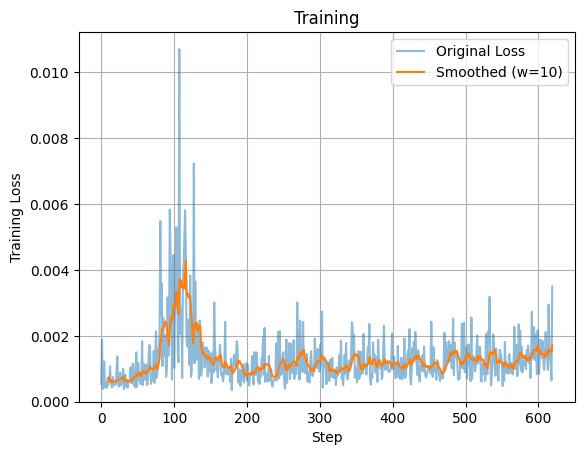

Training: 100%|██████████| 625/625 [52:12<00:00,  5.01s/it, Loss=0.000709]


In [ ]:
num_grad_accum = 2 # Update parameters every 2 steps

train_loop(cm_unet, pipe, train_dataloader, optimizer, ct_loss, num_grad_accum)

In [ ]:
# Save the model
cm_unet.save_pretrained("cm_unet_ex4")
# zip the folder
!zip -r cm_unet_ex4.zip cm_unet_ex4

  adding: cm_unet_ex4/ (stored 0%)
  adding: cm_unet_ex4/README.md (deflated 66%)
  adding: cm_unet_ex4/ct/ (stored 0%)
  adding: cm_unet_ex4/ct/adapter_model.safetensors (deflated 8%)
  adding: cm_unet_ex4/ct/adapter_config.json (deflated 54%)


## Part 5

### Generation with CM

Now we can generate images with our model using DDIM solver for diffusion. The sampler we need is illustrated the following way:

<div>
<img src="https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/cd-sampling-idea.jpg" width="600"/>
</div>

Mathematically:

$x_{t_n} \sim {N}(0, I)$

$for\ t_i \in [t_n, ..., t_1]:$

* $\epsilon \leftarrow unet(x_{t_i})$

* $x_0 \leftarrow DDIM(\epsilon, x_{t_i}, t_i, 0)$

* $x_{t_{i-1}} \leftarrow q(x_{t_{i-1}} | x_0)$


**Classifier-free guidance (CFG)**

We will use CFG in CM sampling:

$\epsilon_w = {\color{blue}{\epsilon_{uncond}}} + w \cdot (\epsilon_{cond} - \epsilon_{uncond})$, где $w \geq 1$

**Note:** no guidance corresponds to $w = 1$.

In [ ]:
@torch.no_grad()
def consistency_sampling(
    pipe,
    prompt,
    num_inference_steps=4,
    generator=None,
    num_images_per_prompt=4,
    guidance_scale=1
):
    if prompt is not None and isinstance(prompt, str):
        batch_size = 1
    elif prompt is not None and isinstance(prompt, list):
        batch_size = len(prompt)

    device = pipe._execution_device

    # Extracting embeddings from text prompts
    do_classifier_free_guidance = guidance_scale > 0
    prompt_embeds, null_prompt_embeds = pipe.encode_prompt(
        prompt=prompt,
        num_images_per_prompt=num_images_per_prompt,
        do_classifier_free_guidance=do_classifier_free_guidance,
        device=device,
    )

    # Setup scheduler
    assert pipe.scheduler.config['timestep_spacing'] == 'trailing'
    pipe.scheduler.set_timesteps(num_inference_steps)

    # Batch of latents from N(0,I)
    latents = pipe.prepare_latents(
        batch_size * num_images_per_prompt,
        pipe.vae.config.latent_channels,
        pipe.vae.config.sample_size,
        pipe.vae.config.sample_size,
        generator=generator,
        device=device,
        dtype=torch.float16,
    )

    for i, t in enumerate(tqdm(pipe.scheduler.timesteps)):
        t = torch.tensor([t] * len(latents)).to(device)
        zero_t = torch.tensor([0] * len(latents)).to(device)

        cond_noise_pred = pipe.unet(latents, t, encoder_hidden_states=prompt_embeds).sample

        if do_classifier_free_guidance:
            uncond_noise_pred = pipe.unet(latents, t, encoder_hidden_states=null_prompt_embeds).sample
            noise_pred = uncond_noise_pred + guidance_scale * (cond_noise_pred - uncond_noise_pred)
        else:
            noise_pred = cond_noise_pred

        # Get x_0 prediction from x_t
        x_0 = ddim_solver_step(noise_pred, latents, t, zero_t, pipe.scheduler)

        if i + 1 < num_inference_steps:
            # Next step
            s = pipe.scheduler.timesteps[i+1]
            s = torch.tensor([s] * len(latents)).to(device)

            latents = q_sample(x_0, s, pipe.scheduler)
        else:
            # Last step
            latents = x_0

        latents = latents.half()

    image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False)[0]
    do_denormalize = [True] * image.shape[0]
    image = pipe.image_processor.postprocess(image, output_type="pil", do_denormalize=do_denormalize)
    return image

Reference generation for guidance_scale=2 (better than before, but not great).

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/reference-ct.png)

In [ ]:
# Load the model (1)
if os.path.exists("cm_unet_ex4"):
    print("Loading model from exercise 4")
    cm_unet = PeftModel.from_pretrained(
        unet,
        "cm_unet_ex4",
        subfolder='ct',
        config=lora_config,
        adapter_name="ct",
    )


Loading model from exercise 4


100%|██████████| 4/4 [00:02<00:00,  1.49it/s]


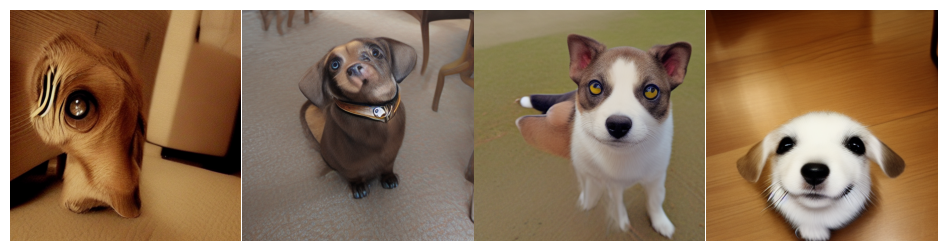

In [ ]:
pipe.unet = cm_unet.eval().to(torch.float16)
assert cm_unet.active_adapter == 'ct'

generator = torch.Generator(device="cuda").manual_seed(1)
guidance_scale = 2

# Use consistency sampling.
images = consistency_sampling(pipe=pipe,
                              prompt=prompt,
                              generator=generator,
                              num_images_per_prompt=4,
                              num_inference_steps=4,
                              guidance_scale=guidance_scale)
visualize_images(images)

# Consistency Distillation

## Part 6

We will implement the distilation task where the step from $x_t$ to $x_s$ will be done using teacher model instead of analytical approach.  

$\mathbf{x}_t = q(\mathbf{x}_t | \mathbf{x}_0)$

$\mathbf{x}_s = DDIM(\epsilon_\theta(\mathbf{x}_t, t), \mathbf{x}_t, t, s)$

**Note:**
In text-to-image generation *classifier-free guidance (CFG)* is an extremely importan parameters for high-quality samples. CFG changes the trajectory of ODE, so we will distill them with CFG.

Thus, to get $\mathbf{x}_{s}$ will use the step of teacher model with CFG. This is an important difference from CT setup, where we couldn't model guidance.

In [ ]:
@torch.no_grad()
def get_xs_from_xt_with_teacher(
    x_0, x_t, t, s, # not all arguments will be used
    scheduler,
    prompt_embeds,
    teacher_unet,
    guidance_scale,
    **kwargs
):
    # Prediction of the teacher for the conditional case (with embeddings)
    cond_noise_pred = teacher_unet(x_t, t, encoder_hidden_states=prompt_embeds).sample

    # Use empty prompt "" for an unconditional case
    uncond_input_ids = pipe.tokenizer(
        [""], return_tensors="pt", padding="max_length", max_length=77
    ).input_ids.to("cuda")

    # Convert to batch size
    uncond_prompt_embeds = pipe.text_encoder(uncond_input_ids)[0].expand(
        *prompt_embeds.shape
    )

    # Prediction of the teacher for the unconditional case (emptry prompts)
    uncond_noise_pred = teacher_unet(x_t, t, encoder_hidden_states=uncond_prompt_embeds).sample

    # CFG formula
    noise_pred = uncond_noise_pred + guidance_scale * (cond_noise_pred - uncond_noise_pred)

    # Get x_s from x_t
    x_s = ddim_solver_step(noise_pred, x_t, t, s, scheduler)
    return x_s


# Set the teacher model and and guidance_scale
get_xs_from_xt_with_teacher = functools.partial(
    get_xs_from_xt_with_teacher,
    teacher_unet=teacher_unet,
    guidance_scale=7.5
)

In paper [Improved Techniques for Training Consistency Models](https://arxiv.org/pdf/2310.14189) it was suggested to use pseudo-huber loss instead of L2.

In [ ]:
def pseudo_huber_loss(
    x: torch.Tensor,
    y: torch.Tensor,
    c=0.001
):
    loss = torch.sqrt(torch.norm(x - y, p=2)**2 + c**2) - c
    return loss

In [ ]:
cd_loss = functools.partial(
    cm_loss_template,

    loss_fn=pseudo_huber_loss, # New loss
    get_boundary_timesteps=get_zero_boundary_timesteps,
    get_xs_from_xt=get_xs_from_xt_with_teacher
)

assert cm_unet.active_adapter == 'cd'

**Train the model in CD mode**

In [ ]:
unet = unet.to(torch.float32)
unet.train()
assert unet.dtype == torch.float32

# Add new LoRA adapters for CD model
cm_unet.add_adapter("cd", lora_config)
cm_unet.set_adapter("cd")

# Reinitialize oprimizer
optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=1e-4)

<Figure size 640x480 with 0 Axes>

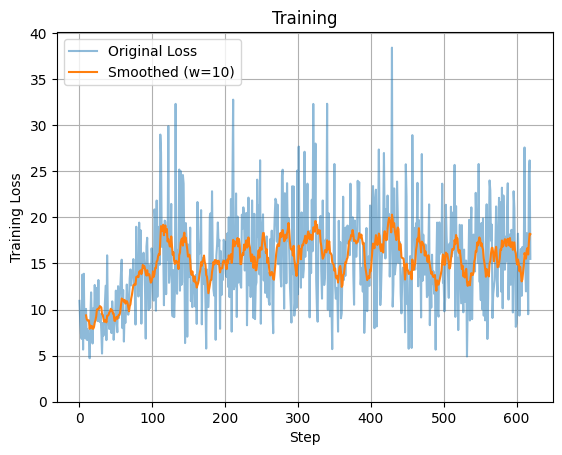

Training: 100%|██████████| 625/625 [1:04:43<00:00,  6.21s/it, Loss=19.1]


In [ ]:
num_grad_accum = 2 # update parameters every 2 steps

train_loop(cm_unet, pipe, train_dataloader, optimizer, cd_loss, num_grad_accum)

In [ ]:
# Save the model
cm_unet.save_pretrained("cm_unet_ex6")
# zip the folder
!zip -r cm_unet_ex6.zip cm_unet_ex6

  adding: cm_unet_ex6/ (stored 0%)
  adding: cm_unet_ex6/README.md (deflated 66%)
  adding: cm_unet_ex6/cd/ (stored 0%)
  adding: cm_unet_ex6/cd/adapter_model.safetensors (deflated 8%)
  adding: cm_unet_ex6/cd/adapter_config.json (deflated 54%)
  adding: cm_unet_ex6/ct/ (stored 0%)
  adding: cm_unet_ex6/ct/adapter_model.safetensors (deflated 42%)
  adding: cm_unet_ex6/ct/adapter_config.json (deflated 54%)


### Sampling

Note that here we are sampling **without guidance**, because we have already partially incorporated it into the model when we performed the teacher step using CFG (Classifier-Free Guidance).

For reference, here are the images at this stage:

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/reference-cd.png)

**Your images do not have to match exactly** – they may be slightly lower or higher in quality.  

In [ ]:
# Load the model (1)
if os.path.exists("cm_unet_ex6"):
    print("Loading model from exercise 6")
    cm_unet = PeftModel.from_pretrained(
        unet,
        "cm_unet_ex6",
        subfolder='cd',
        config=lora_config,
        adapter_name="cd",
    )


Loading model from exercise 6


100%|██████████| 4/4 [00:01<00:00,  3.12it/s]


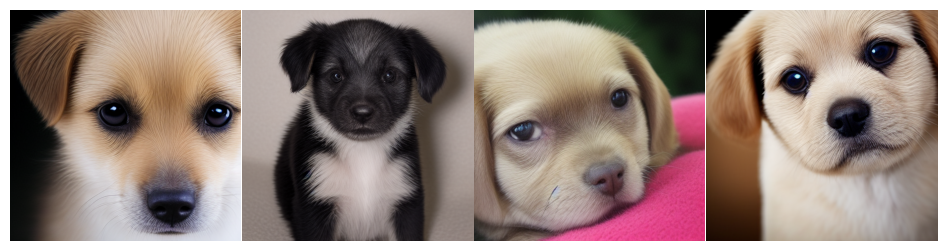

In [ ]:
# Load our model in the pipeline
pipe.unet = cm_unet.eval().to(torch.float16)
assert cm_unet.active_adapter == 'cd'

generator = torch.Generator(device="cuda").manual_seed(0)
guidance_scale = 1 #0

images = consistency_sampling(pipe,
                              prompt,
                              generator=generator,
                              num_images_per_prompt=4,
                              num_inference_steps=4,
                              guidance_scale=guidance_scale)
visualize_images(images)

#### We will check the results on other prompts


100%|██████████| 4/4 [00:01<00:00,  3.02it/s]


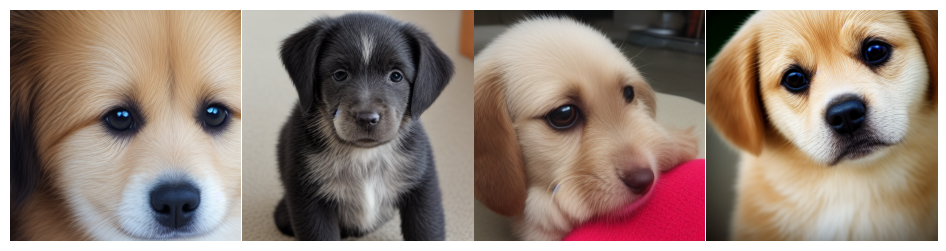

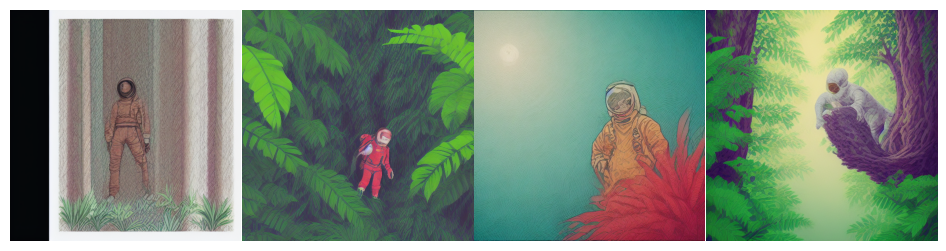

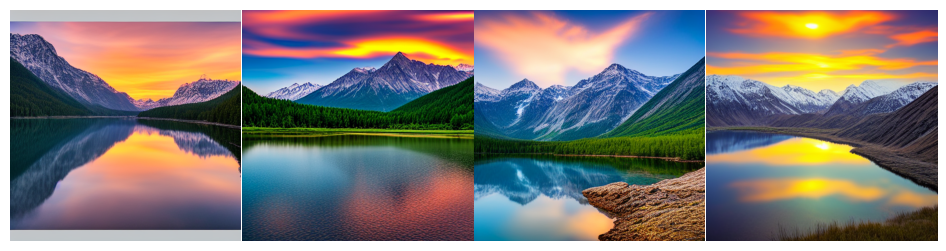

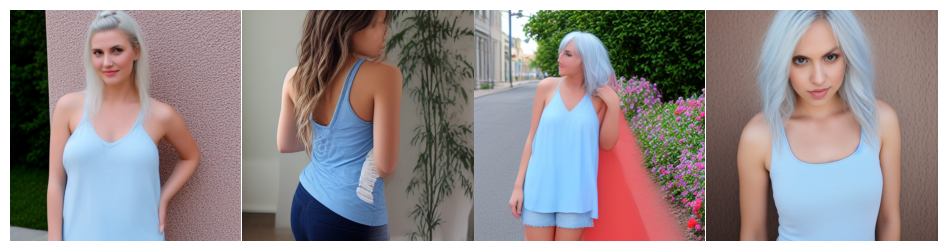

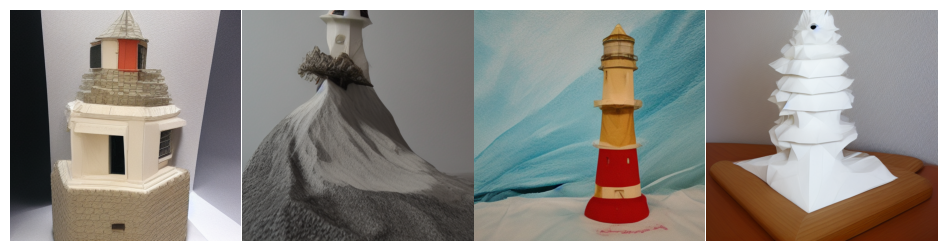

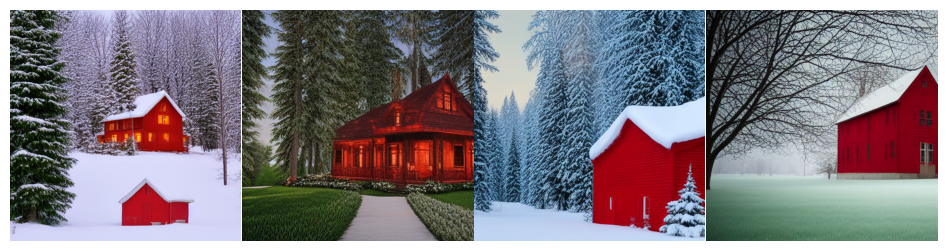

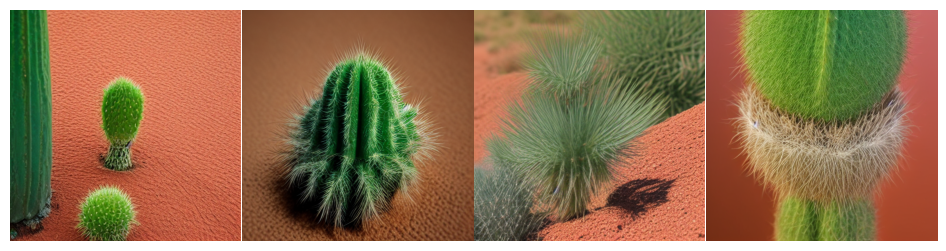

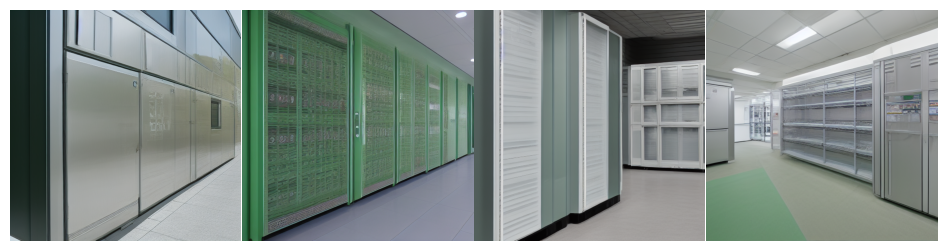

In [ ]:
validation_prompts = [
    "A sad puppy with large eyes",
    "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k",
    "A photo of beautiful mountain with realistic sunset and blue lake, highly detailed, masterpiece",
    "A girl with pale blue hair and a cami tank top",
    "A lighthouse in a giant wave, origami style",
    "belle epoque, christmas, red house in the forest, photo realistic, 8k",
    "A small cactus with a happy face in the Sahara desert",
    "Green commercial building with refrigerator and refrigeration units outside",
]

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(0)

    images = consistency_sampling(pipe=pipe,
                              prompt=prompt,
                              generator=generator,
                              num_images_per_prompt=4,
                              num_inference_steps=4,
                              guidance_scale=guidance_scale)

    visualize_images(images)

# Multi-boundary Сonsistency Distillation
<div>
<img src=https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/multi-cd-idea.jpg width=600>
<div>
    
In the end, we will look at a recent modification of CD called **Multi-boundary CD**.  
Instead of integrating the entire trajectory at once and then sampling backward,  
we divide the trajectory into $K$ segments and apply CD **independently** within each segment.

For example, in the image above, we see two segments: the green and red points mark two boundary points.

In the classical CD we discussed earlier, there is only **one boundary point** at $t = 0$.
    
**Note:** Sampling becomes deterministic again, so we can reuse the DDIM solver, where the number of steps equals the number of intervals $K$ we split the trajectory into during training.

This method works much better than regular CD, because solving CD on short segments is **much easier** than over the full trajectory. In this task, we will split the trajectory into $K = 4$ segments.


More can be found [here](https://arxiv.org/pdf/2403.06807).

## Part 7
We implement which wil for $K=4$ provide the boundary points for each segments.

For example, if we divide the trajectory into $K = 2$ segments,  
the boundary points will be: [0, 499].


$0 \leq t < 499$, the boundary point is $0$

$499 \leq t < 999$, the boundary point is $499$

**Note:** Remember that the interval between $t$ and $s$ is 20 steps.


In [ ]:
def get_multi_boundary_timesteps(
    timesteps,
    num_boundaries=4,
    num_timesteps=1000,
):
    """
    For a batch of timesteps, determine the corresponding boundary points.
    params:
        timesteps: torch.Tensor(batch_size, device='cuda')
    returns:
        boundary_timesteps: torch.Tensor(batch_size, device='cuda')
    """

    # Do not split the interval
    if num_boundaries < 2:
      return timesteps

    # Determine the boundary points
    boundary_points = torch.linspace(0, num_timesteps - 1, num_boundaries, device=timesteps.device, dtype=torch.long)
    #print('boundary_points', boundary_points)

    # For each timestep, find the nearest boundary point to the left
    indices = torch.searchsorted(boundary_points, timesteps, right=True) - 1
    boundary_timesteps = boundary_points[indices]

    #print('timesteps:', timesteps)
    #print('boundary_timesteps:', boundary_timesteps)

    return boundary_timesteps

In [ ]:
unet = unet.to(torch.float32)
unet.train()
assert unet.dtype == torch.float32

cm_unet.add_adapter("multi-cd", lora_config)
cm_unet.set_adapter("multi-cd")

# Reinitialize otimizer
optimizer = torch.optim.AdamW(cm_unet.parameters(), lr=1e-4)

In [ ]:
multi_cd_loss = functools.partial(
    cm_loss_template,

    loss_fn=pseudo_huber_loss,
    get_boundary_timesteps=get_multi_boundary_timesteps, # New boundaries
    get_xs_from_xt=get_xs_from_xt_with_teacher
)
assert cm_unet.active_adapter == 'multi-cd'

**Train  Multi-boundary CD model**

<Figure size 640x480 with 0 Axes>

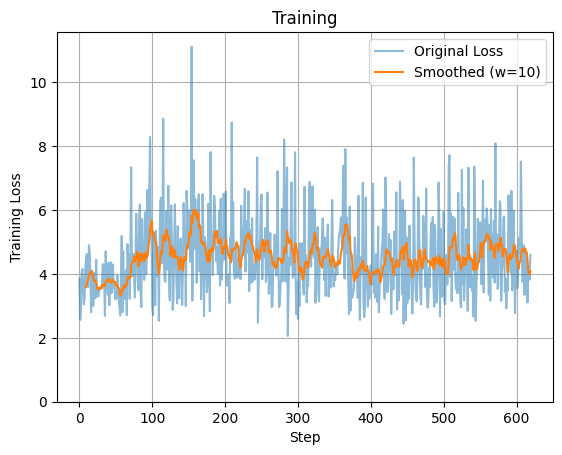

Training: 100%|██████████| 625/625 [1:04:51<00:00,  6.23s/it, Loss=4.77]


In [ ]:
num_grad_accum = 2 # update parameters every 2 steps

train_loop(cm_unet, pipe, train_dataloader, optimizer, multi_cd_loss, num_grad_accum)

In [ ]:
# Save the model
cm_unet.save_pretrained("cm_unet_ex7")
# zip the folder
!zip -r cm_unet_ex7.zip cm_unet_ex7

  adding: cm_unet_ex7/ (stored 0%)
  adding: cm_unet_ex7/README.md (deflated 66%)
  adding: cm_unet_ex7/cd/ (stored 0%)
  adding: cm_unet_ex7/cd/adapter_model.safetensors (deflated 24%)
  adding: cm_unet_ex7/cd/adapter_config.json (deflated 54%)
  adding: cm_unet_ex7/ct/ (stored 0%)
  adding: cm_unet_ex7/ct/adapter_model.safetensors (deflated 42%)
  adding: cm_unet_ex7/ct/adapter_config.json (deflated 54%)
  adding: cm_unet_ex7/multi-cd/ (stored 0%)
  adding: cm_unet_ex7/multi-cd/adapter_model.safetensors (deflated 8%)
  adding: cm_unet_ex7/multi-cd/adapter_config.json (deflated 54%)


### Sampling (for the last time)

**Note:** now we can sample using the original solver in 4 steps in a deterministic way.

Reference images, the generated ones can be better/worse then those.![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/reference-multi-cd.png)

100%|██████████| 4/4 [00:02<00:00,  1.61it/s]


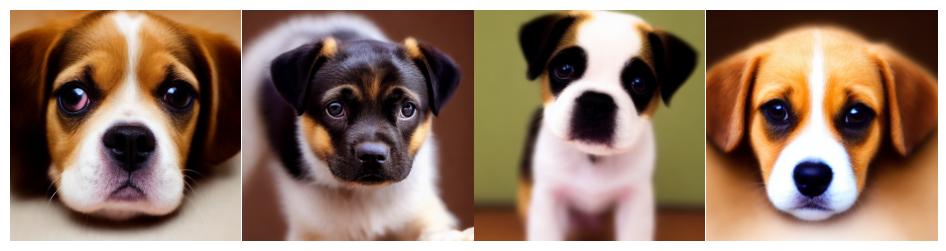

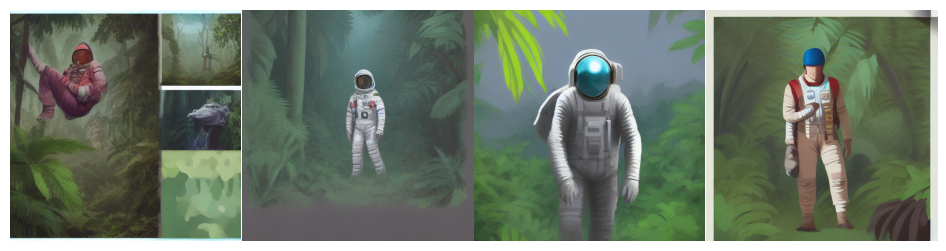

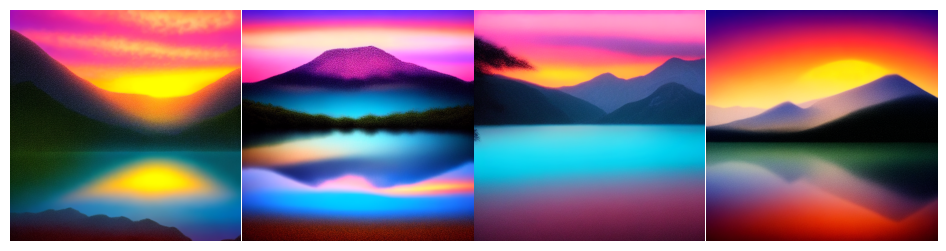

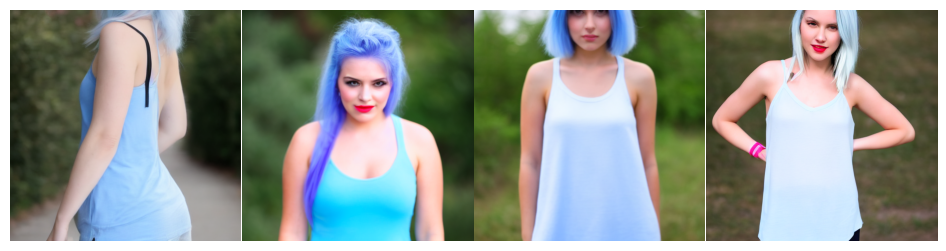

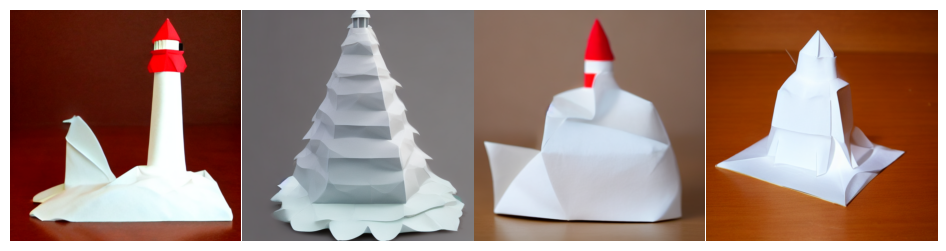

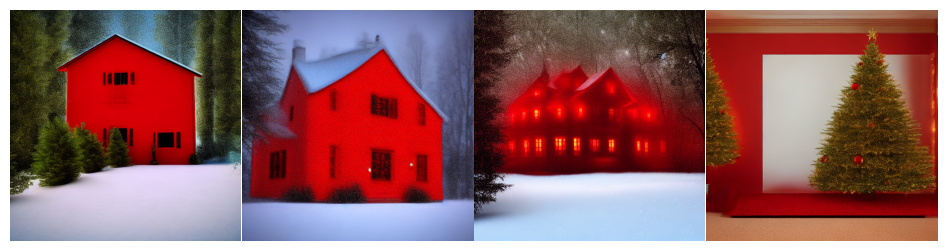

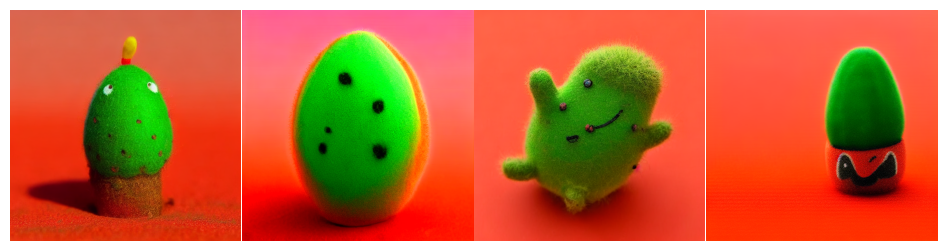

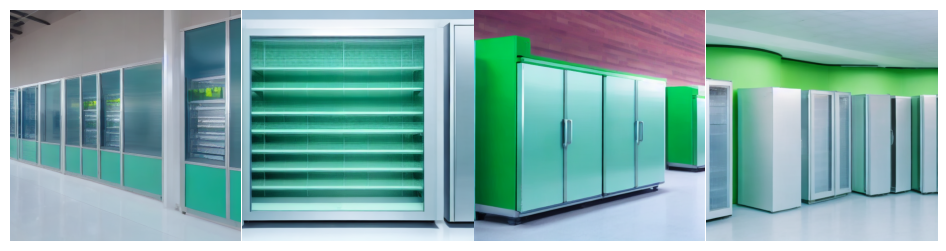

In [ ]:
pipe.unet = cm_unet.eval().to(torch.float16)
assert cm_unet.active_adapter == 'multi-cd'

guidance_scale = 5

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(1)

    images = consistency_sampling(pipe=pipe,
                             prompt=prompt,
                             generator=generator,
                             num_images_per_prompt=4,
                             num_inference_steps=4,
                             guidance_scale=guidance_scale)

    visualize_images(images)

## Part 8

Finally, we will upload the last model to HuggingFace

1) Create an account at [huggingface.co](huggingface.co)

2) Get your HF token, which you can find here https://huggingface.co/settings/tokens

3) (Optional) Add your token to Colab Secrets

4) Create a repository for your model at: https://huggingface.co/new


In [ ]:
cm_unet.push_to_hub(
    "usemil/SD1.5-CD", # "<username>/<repo-name>"
    token=userdata.get("HF_TOKEN_CV_WEEK") # Or your token directly here
)

README.md:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

Upload 3 LFS files:   0%|          | 0/3 [00:00<?, ?it/s]

adapter_model.safetensors:   0%|          | 0.00/135M [00:00<?, ?B/s]

adapter_model.safetensors:   0%|          | 0.00/269M [00:00<?, ?B/s]

adapter_model.safetensors:   0%|          | 0.00/135M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/usemil/SD1.5-CD/commit/94f8d24a5d1eac7ebdc31f1aa79aa979a983e4f2', commit_message='Upload model', commit_description='', oid='94f8d24a5d1eac7ebdc31f1aa79aa979a983e4f2', pr_url=None, pr_revision=None, pr_num=None)

Check that all was done successfully.

In [ ]:
# Download the model from the hub

loaded_cm_unet = PeftModel.from_pretrained(
    unet,
    "usemil/SD1.5-CD", # "<username>/<repo-name>"
    token=userdata.get("HF_TOKEN_CV_WEEK"), # Or your token directly here
    subfolder='multi-cd',
    adapter_name="multi-cd",
)

multi-cd%2Fadapter_config.json:   0%|          | 0.00/895 [00:00<?, ?B/s]

adapter_model.safetensors:   0%|          | 0.00/135M [00:00<?, ?B/s]

100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


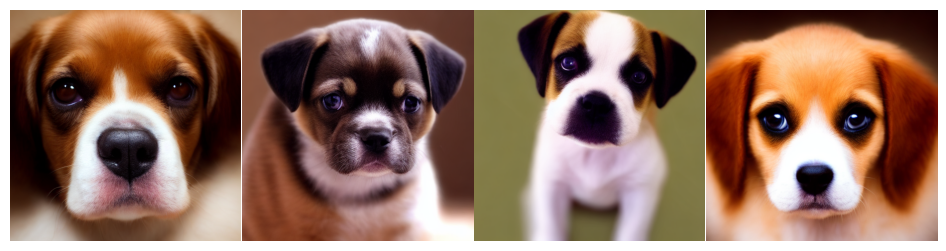

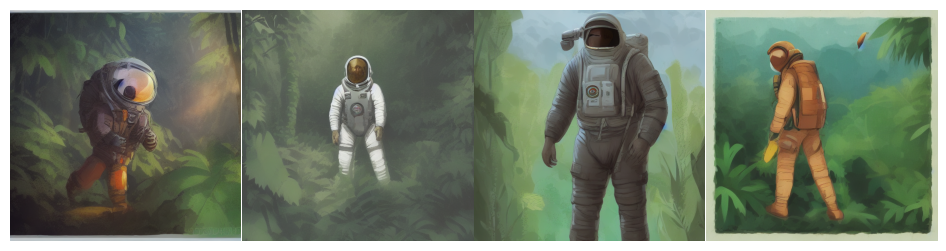

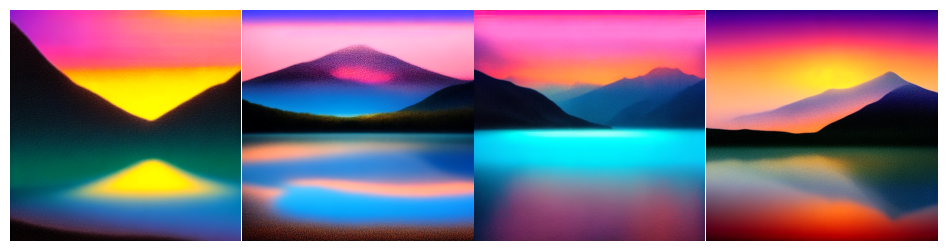

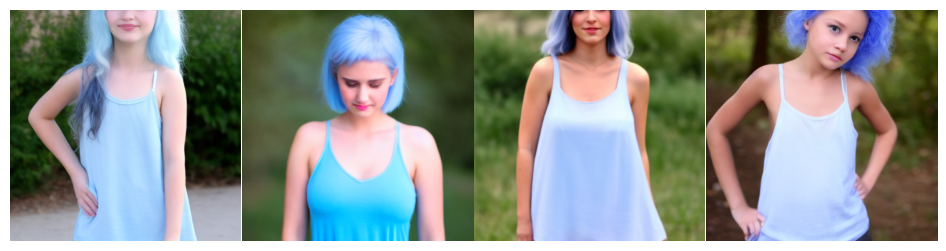

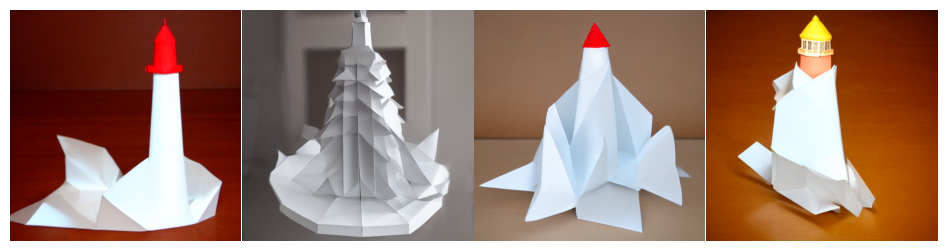

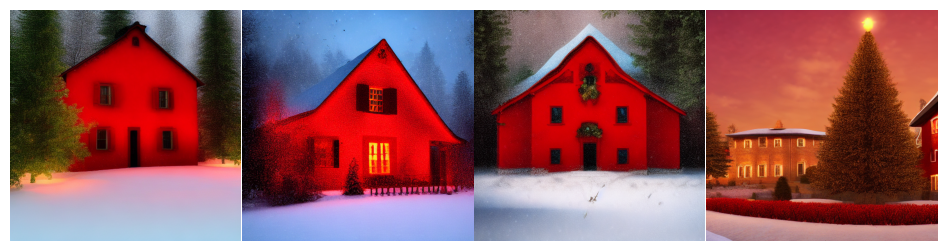

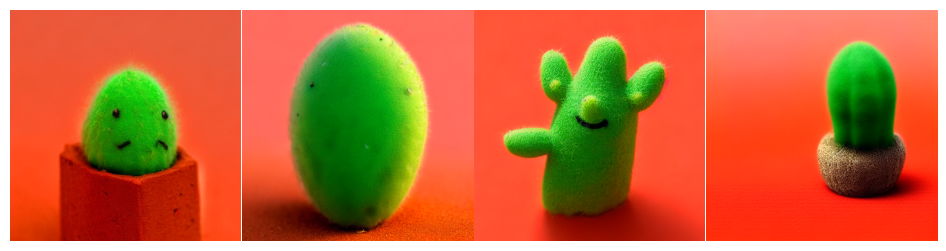

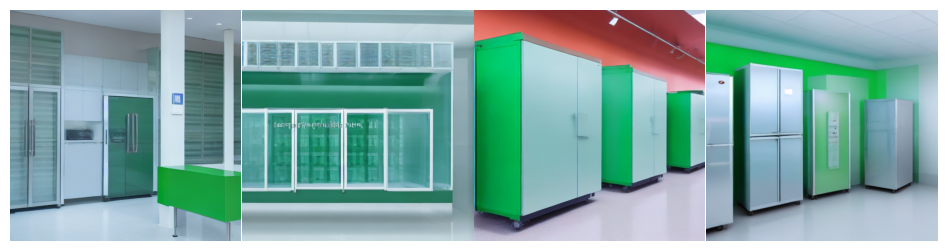

In [ ]:
pipe.unet = loaded_cm_unet.eval().to(torch.float16)
assert loaded_cm_unet.active_adapter == 'multi-cd'

guidance_scale = 2

for prompt in validation_prompts:
    generator = torch.Generator(device="cuda").manual_seed(1)

    images = consistency_sampling(pipe=pipe,
                             prompt=prompt,
                             generator=generator,
                             num_images_per_prompt=4,
                             num_inference_steps=4,
                             guidance_scale=guidance_scale)
    visualize_images(images)

## Remarks
Some examples of poor generations and reasons behind them.
#### Wrong sampling

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_1.jpg)
![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_2.jpg)

#### Errors in training

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_3.jpg)
![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_4.jpg)

#### Undertrained model

![img](https://storage.yandexcloud.net/yandex-research/cvweek-cd-task-images/fail_case_5.jpg)
